In [4]:
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image
import matplotlib.pyplot as plt
import time

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float32 if device.type == 'cpu' else torch.float16
).to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

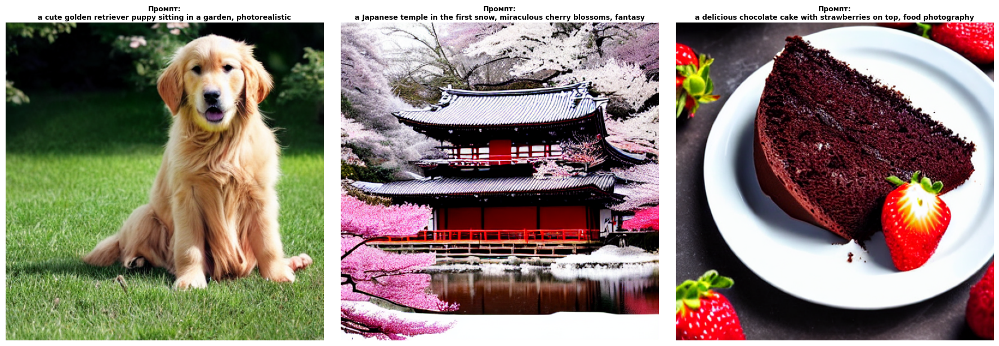

In [13]:
# ============================================================================
# 2. БАЗОВА ГЕНЕРАЦІЯ З РІЗНИМИ ПРОМПТАМИ
# ============================================================================
prompts = [
    "a cute golden retriever puppy sitting in a garden, photorealistic",
    "a Japanese temple in the first snow, miraculous cherry blossoms, fantasy",
    "a delicious chocolate cake with strawberries on top, food photography",
]

def show_image(img, title=""):
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

generated_images = []

for i, prompt in enumerate(prompts):
    start_time = time.time()
    with torch.no_grad():
        image = pipe(
            prompt=prompt,
            num_inference_steps=50,
            guidance_scale=7.5,
            height=512,
            width=512,
            num_images_per_prompt=1
        ).images[0]

    elapsed_time = time.time() - start_time

    generated_images.append(image)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for i, (img, prompt) in enumerate(zip(generated_images, prompts)):
    axes[i].imshow(img)
    axes[i].set_title(f"Промпт:\n{prompt}", fontsize=9, fontweight='bold', wrap=True)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Промпт: 'a majestic wolf sitting above mountains, photorealistic'


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

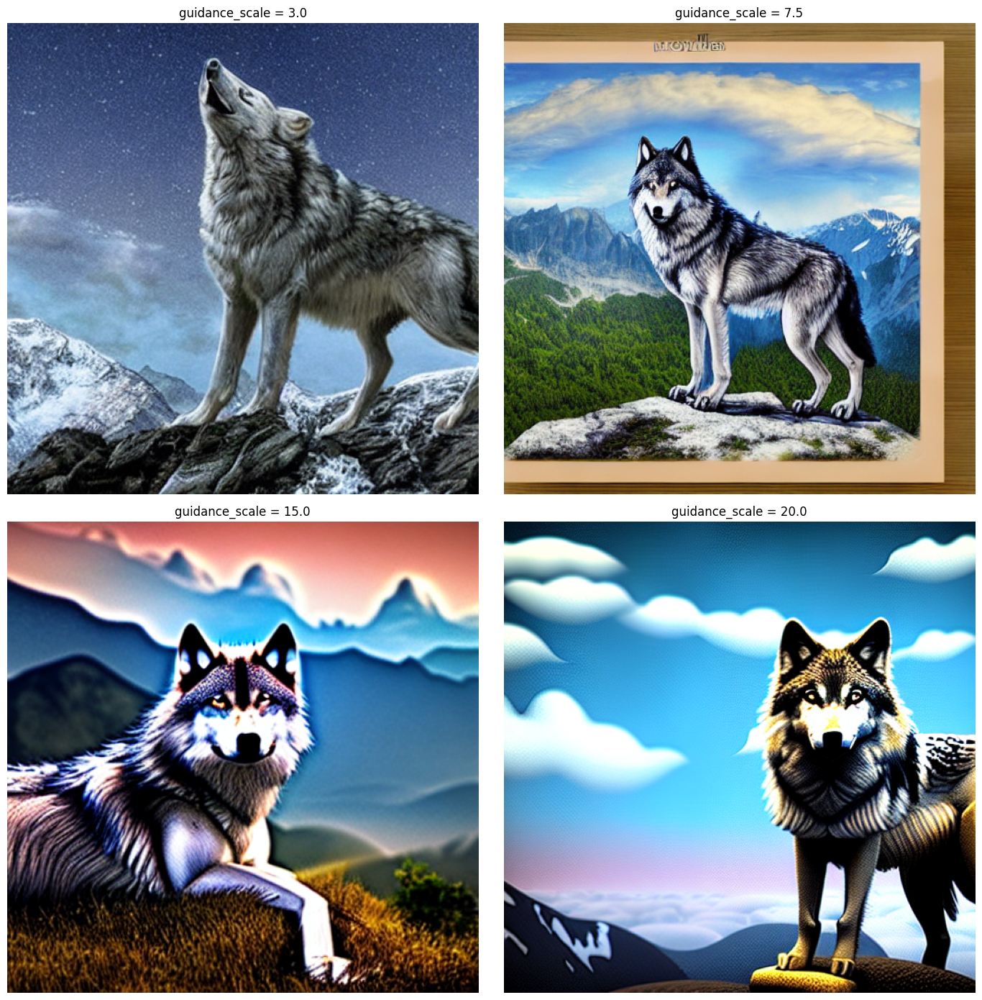

In [17]:
# ============================================================================
# 3. ВПЛИВ GUIDANCE SCALE (точність слідування промпту)
# ============================================================================

test_prompt = "a majestic wolf sitting above mountains, photorealistic"
guidance_scales = [3.0, 7.5, 15.0, 20.0]
guidance_results = []

print(f"Промпт: '{test_prompt}'")

for guidance_scale in guidance_scales:
    with torch.no_grad():
        image = pipe(
            prompt=test_prompt,
            num_inference_steps=50,
            guidance_scale=guidance_scale,
            height=512,
            width=512
        ).images[0]
    guidance_results.append(image)

fig, axes = plt.subplots(2, 2, figsize=(14, 14))
for idx, (guidance_val, img) in enumerate(zip(guidance_scales, guidance_results)):
    ax = axes[idx // 2, idx % 2]
    ax.imshow(img)
    ax.set_title(f'guidance_scale = {guidance_val}', fontsize=12)
    ax.axis('off')
plt.tight_layout()
plt.show()

Промпт: 'shark near the ship, 8k, photorealistic'

   num_inference_steps=20... 

  0%|          | 0/20 [00:00<?, ?it/s]


   num_inference_steps=30... 

  0%|          | 0/30 [00:00<?, ?it/s]


   num_inference_steps=50... 

  0%|          | 0/50 [00:00<?, ?it/s]

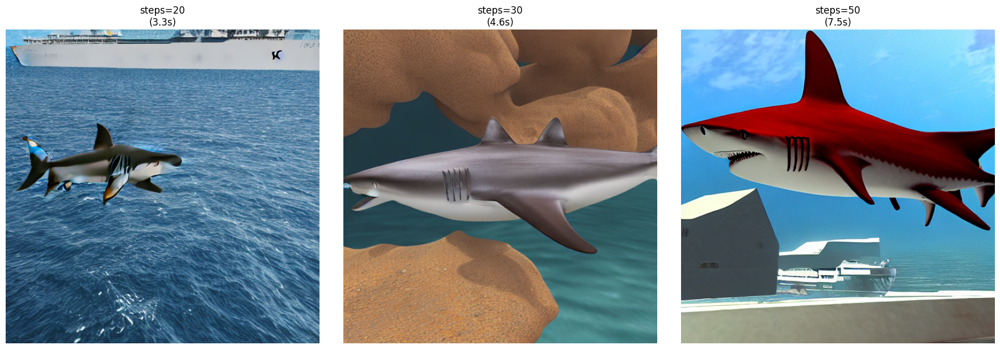

In [24]:
# ============================================================================
# 4. ВПЛИВ КІЛЬКОСТІ КРОКІВ (num_inference_steps)
# ============================================================================

test_prompt2 = "shark near the ship, 8k, photorealistic"
steps_list = [20, 30, 50]
steps_results = []
steps_times = []

print(f"Промпт: '{test_prompt2}'")

for num_steps in steps_list:
    start_time = time.time()
    with torch.no_grad():
        image = pipe(
            prompt=test_prompt2,
            num_inference_steps=num_steps,
            guidance_scale=7.5,
            height=512,
            width=512
        ).images[0]
    elapsed_time = time.time() - start_time
    steps_results.append(image)
    steps_times.append(elapsed_time)

fig, axes = plt.subplots(1, len(steps_list), figsize=(6 * len(steps_list), 6))
if len(steps_list) == 1:
    axes = [axes]
for ax, img, num_steps, t in zip(axes, steps_results, steps_list, steps_times):
    ax.imshow(img)
    ax.set_title(f"steps={num_steps}\n({t:.1f}s)", fontsize=12)
    ax.axis('off')
plt.tight_layout()
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

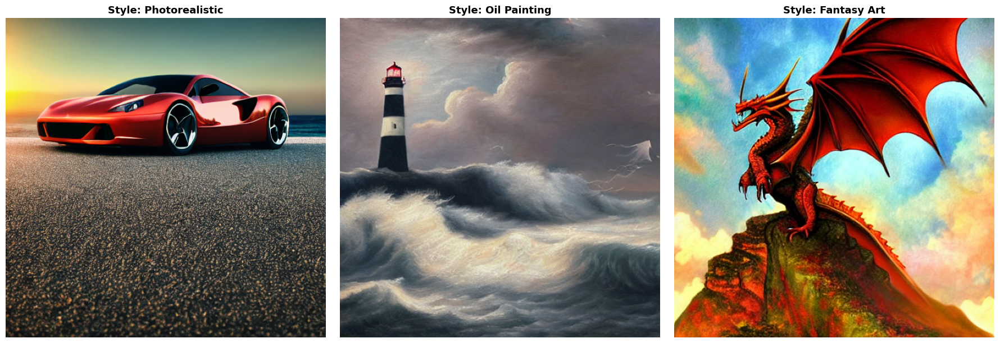

In [27]:
style_prompts = {
    "Photorealistic": "a luxury sports car parked on a beach at sunset, photorealistic, 8k",
    "Oil Painting": "a stormy sea with a lighthouse on a cliff, oil painting, masterpiece",
    "Fantasy Art": "a fantasy dragon perched on a mountain top, magical aura, fantasy art",
}
style_results = {}

for style_name, prompt in style_prompts.items():
    with torch.no_grad():
        image = pipe(
            prompt=prompt,
            num_inference_steps=50,
            guidance_scale=7.5,
            height=512,
            width=512
        ).images[0]
    style_results[style_name] = image

fig, axes = plt.subplots(1, len(style_results), figsize=(6*len(style_results), 6))
if len(style_results) == 1:
    axes = [axes]
for i, (style_name, image) in enumerate(style_results.items()):
    axes[i].imshow(image)
    axes[i].set_title(f"Style: {style_name}", fontsize=13, fontweight='bold')
    axes[i].axis('off')
plt.tight_layout()
plt.show()
